In [1]:
import mne
import numpy as np
from glob import glob
from sys import platform
import os
from blink_utils import *
import mat73

# Path to FIF files
As generated per subject-trial in [2.2-eeg-stim-to-npy-fif.ipynb](../../2-mat-to-npy-fif/2.2-eeg-stim-to-npy-fif.ipynb)

In [2]:
SUBJECT = 1

# input paths
FIF_PATH = os.path.join('..', '..', '2-mat-to-npy-fif', 'fif')
BLINK_SUMMARY_PATH = os.path.join(
    '..', 
    '..', 
    '3-find-blinks', 
    '3.1-eeglab-blinker', 
    'blinkerDumpDir', 
    f'dataSub{SUBJECT}_BlinkSummary.mat',
)

# output paths
MERGED_FIF_PATH = 'merged-fif'

print(FIF_PATH)
print(MERGED_FIF_PATH)
print(BLINK_SUMMARY_PATH)

# only for debugging trial order (if needed)
STIM_MAT_PATH = os.path.join('..', '..', '1-source-data', 'datasetCND_musicImagery', 'dataCND', 'dataStim.mat')
EEG_MAT_PATH = os.path.join('..', '..', '1-source-data', 'datasetCND_musicImagery', 'dataCND') # append .mat paths for each subject below

../../2-mat-to-npy-fif/fif
merged-fif
../../3-find-blinks/3.1-eeglab-blinker/blinkerDumpDir/dataSub1_BlinkSummary.mat


In [3]:
DATA_FILES = glob(FIF_PATH + os.path.sep + f'subject-{SUBJECT}_*.fif')
DATA_FILES = sorted(DATA_FILES) # to sort by run#
DATA_FILES

['../../2-mat-to-npy-fif/fif/subject-1_trial-00_chor-096_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-01_chor-096_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-02_chor-038_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-03_chor-038_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-04_chor-101_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-05_chor-101_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-06_chor-101_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-07_chor-019_condition-Listening_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-08_chor-096_condition-Imagery_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-09_chor-096_condition-Imagery_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-10_chor-096_condition-Imagery_raw.fif',
 '../../2-mat-to-npy-fif/fif/subject-1_trial-11_c

Combine all raws for one subject (that is, merge all trials from one subject's recording session)

In [4]:
RAWS_SUB = {}

for DATA_FILE in DATA_FILES: #[:2*5]:
    
    raw = mne.io.read_raw_fif(DATA_FILE, preload=True)
    fname = str(raw.filenames[0]).split(os.path.sep)[-1].rstrip('_raw.fif')
    
    toks = fname.split('_')
    subject = int(toks[0].split('-')[-1])
    condition = toks[2] + '/' + toks[3].lstrip('condition-')

    if not subject in RAWS_SUB:
        RAWS_SUB[subject] = []
    RAWS_SUB[subject].append(raw)
    
    #print(fname, subject, condition, run)
print(RAWS_SUB)

Opening raw data file ../../2-mat-to-npy-fif/fif/subject-1_trial-00_chor-096_condition-Listening_raw.fif...
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Reading 0 ... 1802  =      0.000 ...    28.156 secs...
Opening raw data file ../../2-mat-to-npy-fif/fif/subject-1_trial-01_chor-096_condition-Listening_raw.fif...
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Reading 0 ... 1802  =      0.000 ...    28.156 secs...
Opening raw data file ../../2-mat-to-npy-fif/fif/subject-1_trial-02_chor-038_condition-Listening_raw.fif...
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Reading 0 ... 1802  =      0.000 ...    28.156 secs...
Opening raw data file ../../2-mat-to-npy-fif/fif/subject-1_trial-03_chor-038_condition-Listening_raw.fif...
    Range : 0 ... 1802 =      0.000 ...    28.156 secs
Ready.
Reading 0 ... 1802  =      0.000 ...    28.156 secs...
Opening raw data file ../../2-mat-to-npy-fif/fif/subject-1_trial-04_chor-101_condition-Listening_raw

In [5]:
RAWS_SUB[SUBJECT]

[<Raw | subject-1_trial-00_chor-096_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-01_chor-096_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-02_chor-038_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-03_chor-038_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-04_chor-101_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-05_chor-101_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-06_chor-101_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-07_chor-019_condition-Listening_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_trial-08_chor-096_condition-Imagery_raw.fif, 68 x 1803 (28.2 s), ~1.0 MiB, data loaded>,
 <Raw | subject-1_tri

In [6]:
merged_raws = mne.concatenate_raws(RAWS_SUB[SUBJECT])
merged_raws

<Raw | subject-1_trial-00_chor-096_condition-Listening_raw.fif, 68 x 158664 (2479.1 s), ~82.4 MiB, data loaded>

Using matplotlib as 2D backend.


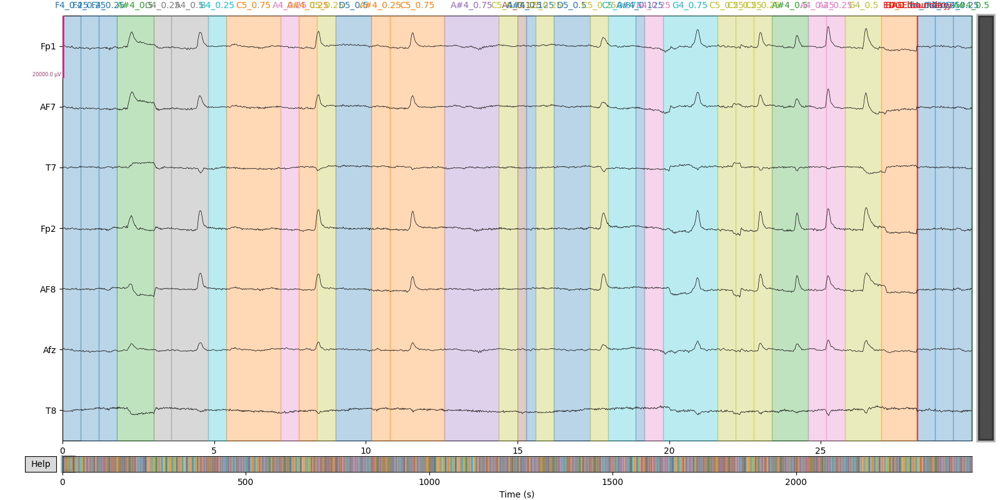

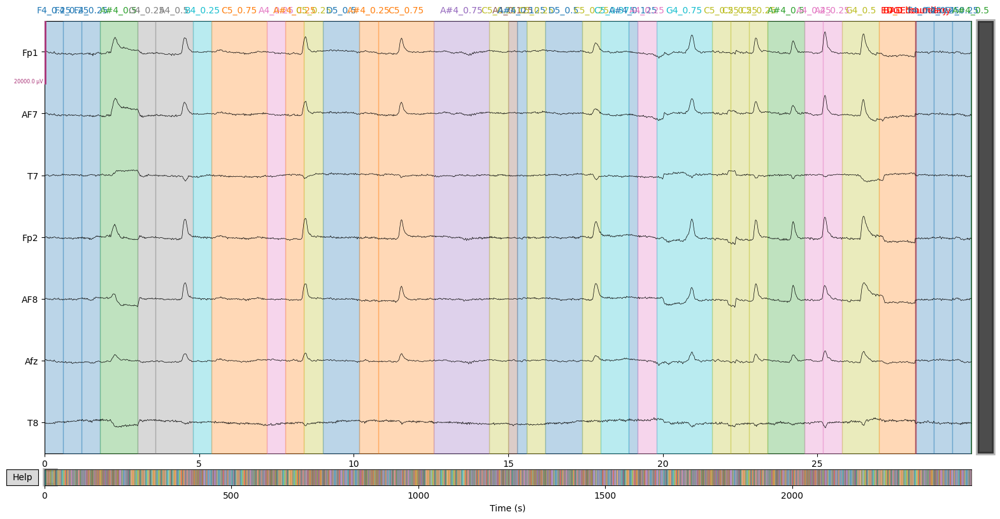

In [7]:
%matplotlib widget 
scalings = {'eeg': 10e-3}

merged_raws.plot(
    scalings = scalings,
    n_channels = 64,
    start = 0, 
    duration = 30, #28.125, #2.4*6,
    picks = ['Fp1', 'Fp2', 'AF7', 'AF8', 'Afz', 'T7', 'T8']
)

In [8]:
note_annot = merged_raws.annotations

In [9]:
mne.count_annotations(merged_raws.annotations)

{'A#4_0.125': 66,
 'A#4_0.25': 220,
 'A#4_0.5': 44,
 'A#4_0.75': 22,
 'A4_0.125': 22,
 'A4_0.25': 308,
 'A4_0.5': 44,
 'B4_0.125': 44,
 'B4_0.25': 88,
 'B4_0.5': 22,
 'B4_0.75': 22,
 'BAD boundary': 87,
 'C#4_0.25': 22,
 'C#5_0.125': 132,
 'C#5_0.25': 352,
 'C4_0.25': 22,
 'C5_0.125': 66,
 'C5_0.25': 330,
 'C5_0.375': 44,
 'C5_0.5': 66,
 'C5_0.75': 44,
 'D#5_0.125': 66,
 'D#5_0.25': 110,
 'D4_0.125': 22,
 'D4_0.25': 44,
 'D4_0.75': 22,
 'D5_0.125': 22,
 'D5_0.25': 132,
 'D5_0.5': 66,
 'E4_0.125': 22,
 'E4_0.25': 88,
 'E4_0.5': 22,
 'E5_0.25': 22,
 'EDGE boundary': 87,
 'F#4_0.25': 110,
 'F#4_0.75': 22,
 'F#5_0.25': 22,
 'F4_0.125': 22,
 'F4_0.25': 176,
 'F4_0.5': 66,
 'F5_0.125': 22,
 'F5_0.25': 88,
 'G#4_0.25': 22,
 'G4_0.125': 22,
 'G4_0.25': 330,
 'G4_0.5': 22,
 'G4_0.75': 22,
 'rest_0.25': 66,
 'rest_0.5': 44}

In [10]:
boundary_annot = note_annot[note_annot.description == 'BAD boundary']
boundary_annot

<Annotations | 87 segments: BAD boundary (87)>

In [11]:
blink_summary = {}

if not SUBJECT in blink_summary.keys():
    blink_summary[SUBJECT] = mat73.loadmat(BLINK_SUMMARY_PATH)

blinks = blink_summary[SUBJECT]['blinks']
status = blinks['status']
print(f'{SUBJECT}: {status}')

usedSignal = blinks['usedSignal']
print(usedSignal)

if type(blinks['signalData']) == list:
    n_signals = len(blinks['signalData'])
    print(f'# signals = {n_signals}')
    usedSignalIdx = np.where([x['signalNumber'] for x in blinks['signalData']] == blinks['usedSignal'])[0][0]
    signal = blinks['signalData'][usedSignalIdx]['signal']
else:
    signal = blinks['signalData']['signal']

blinkFits = blink_summary[SUBJECT]['blinkFits']
maxFrame = [int(x)-1 for x in blinkFits['maxFrame']] # convert to 0 index

signal = blink_summary[SUBJECT]['blinks']['signalData']['signal']
usedSignal = blink_summary[SUBJECT]['blinks']['usedSignal']
# blinkPositions[:, 2]

1: success: 
1.0


Manually identify approx. timings of ok vs. bad blinks/saccades:

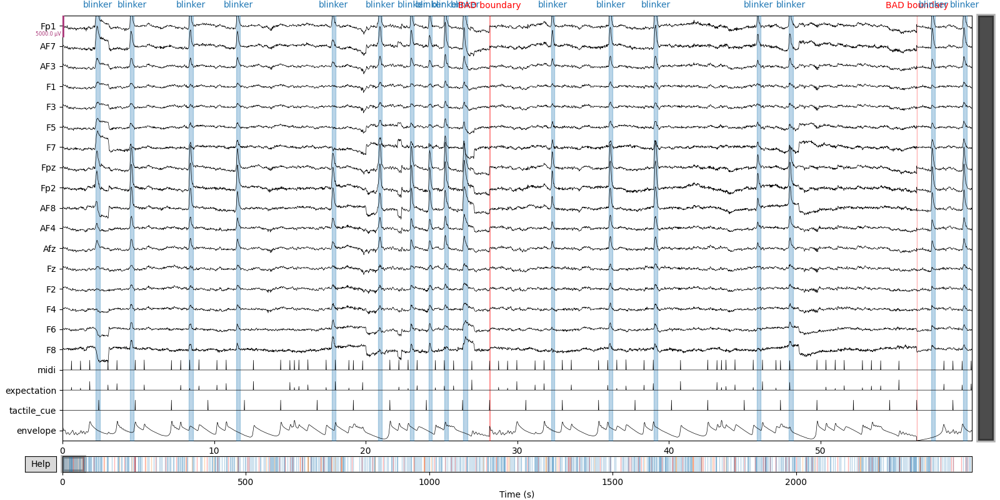

In [12]:
t_manual_blinks = [114, 156, 189.5, 227, 241, 336, 352, 387, 412, 475, 556, 577.1, 647, 668.5, 669.5, 706, 734, 743, 760.6, 852, 957.8, 985]
t_manual_blinks.extend([1005, 1147, 1183, 1215, 1218, 1318, 1348, 1384, 1450, 1587, 1672, 1718, 1743, 1772, 1807, 1832.6])
t_manual_blinks.extend([2018, 2050, 2175, 2224, 2281, 2335, 2337, 2352])

t_bad_blinker = [196.5, 504.14, 607, 627, 654, 712, 1060, 1379, 1385, 1543, 1570, 1662, 1742, 1833.3, 1911, 1928, 1980, 2043, 2206, 2428, 2462.8, 2467.2]

t_bad_saccades = None #[3, 20, 22, 49, 77, 105] #[104.4]

# not in all blinks: 1360
unsure = []

mne.set_config('MNE_BROWSE_RAW_SIZE','16,8') # https://mne.discourse.group/t/can-adjust-raw-plot-figure-size-using-rc-settings-in-v-24/3926/5

# Add blink annotations (note annots will be added back later)
plot_annot( 
    merged_raws=merged_raws,
    boundary_annot=boundary_annot, 
    blink_summary=blink_summary, 
    SUBJECT = SUBJECT,
    t_manual_blinks=t_manual_blinks,
    t_bad_blinker=t_bad_blinker,
    t_bad_saccades = t_bad_saccades,
)

# Find Eye Sweeps

Split back into epochs

In [13]:
events, event_id = mne.events_from_annotations(merged_raws, regexp = "")
events = np.concatenate(([[0, 0, event_id['BAD boundary']]], events), axis=0)
events

Used Annotations descriptions: [np.str_('BAD blinker'), np.str_('BAD boundary'), np.str_('blinker'), np.str_('manual')]


array([[     0,      0,      2],
       [   139,      0,      3],
       [   285,      0,      3],
       ...,
       [157917,      0,      3],
       [158174,      0,      3],
       [158365,      0,      3]], shape=(747, 3))

In [14]:
event_id

{np.str_('BAD blinker'): 1,
 np.str_('BAD boundary'): 2,
 np.str_('blinker'): 3,
 np.str_('manual'): 4}

In [15]:
merged_raws.n_times

np.int64(158664)

In [16]:
trial_epochs = mne.Epochs(
    merged_raws,
    events = events[events[:, 2] == event_id['BAD boundary']],
    tmin = 0,
    tmax = 1802 / merged_raws.info['sfreq'],
    reject = None,
    flat = None,
    baseline = None,
    reject_by_annotation = False,
    preload = True,
)

Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 88 events and 1803 original time points ...
0 bad epochs dropped


In [17]:
trial_epochs.get_data(copy=True).shape

(88, 68, 1803)

Run ICA again, now in MNE, since we didn't save EEGLAB ICA weights...

In [18]:
from mne.preprocessing import ICA

ica = ICA(
    n_components = 10, 
    random_state = 2024, 
    method = 'infomax',
    max_iter = 10000,
)

ica.fit(trial_epochs)

Fitting ICA to data using 64 channels (please be patient, this may take a while)


/tmp/ipykernel_2531212/2610967279.py:10: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(trial_epochs)


Selecting by number: 10 components
Computing Infomax ICA
Fitting ICA took 8.9s.


Method,infomax
Fit parameters,extended=Falsemax_iter=10000
Fit,10000 iterations on epochs (158664 samples)
ICA components,10
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


Get an epoch order resorted by chor-cond to visualize eye sweep IC

In [19]:
condOrder = []
chorOrder = []
trialOrder = []

for filename in merged_raws.filenames:
    filename = str(filename).split(os.path.sep)[-1]
    toks = filename.split('_')
    trial = int(toks[1].split('-')[-1])
    chor = toks[2]
    cond = toks[3].split('-')[-1]

    trialOrder.append(trial)
    chorOrder.append(chor)
    condOrder.append(cond)

In [20]:
import pandas as pd
df = pd.DataFrame()
df['trial'] = trialOrder
df['condition'] = condOrder
df['chorale'] = chorOrder
df

,trial,condition,chorale
0,0,Listening,chor-096
1,1,Listening,chor-096
2,2,Listening,chor-038
3,3,Listening,chor-038
4,4,Listening,chor-101
...,...,...,...
83,83,Imagery,chor-038
84,84,Imagery,chor-101
85,85,Imagery,chor-019
86,86,Imagery,chor-019


In [21]:
df_sorted = df.sort_values(by = ['chorale', 'condition'])
df_sorted

,trial,condition,chorale
32,32,Imagery,chor-019
52,52,Imagery,chor-019
53,53,Imagery,chor-019
54,54,Imagery,chor-019
65,65,Imagery,chor-019
...,...,...,...
35,35,Listening,chor-101
46,46,Listening,chor-101
47,47,Listening,chor-101
56,56,Listening,chor-101


In [22]:
sortOrder = list(df_sorted['trial'])

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
88 matching events found
No baseline correction applied
0 projection items activated


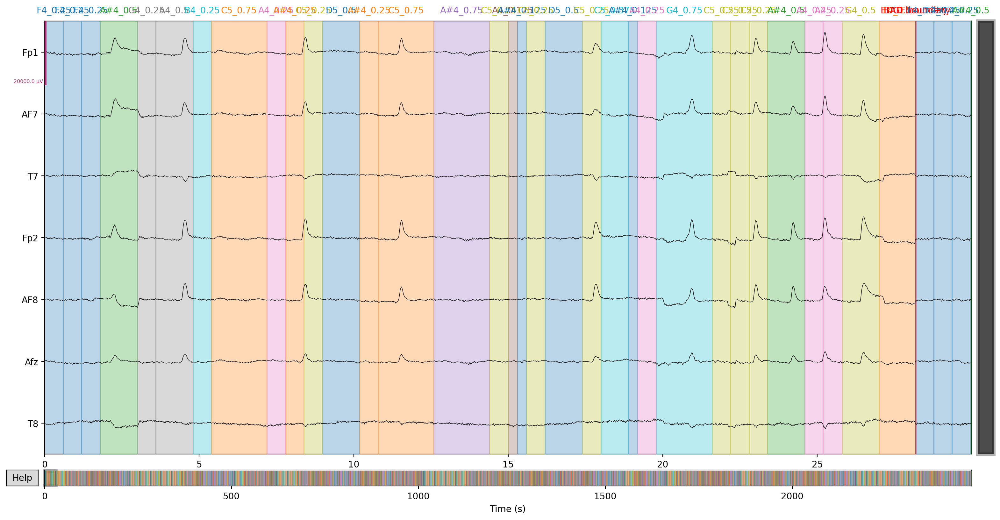

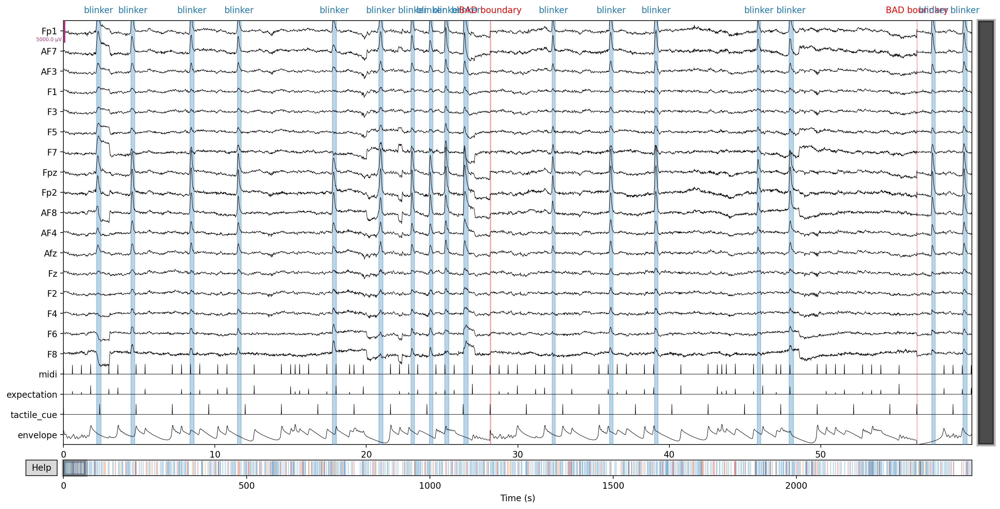

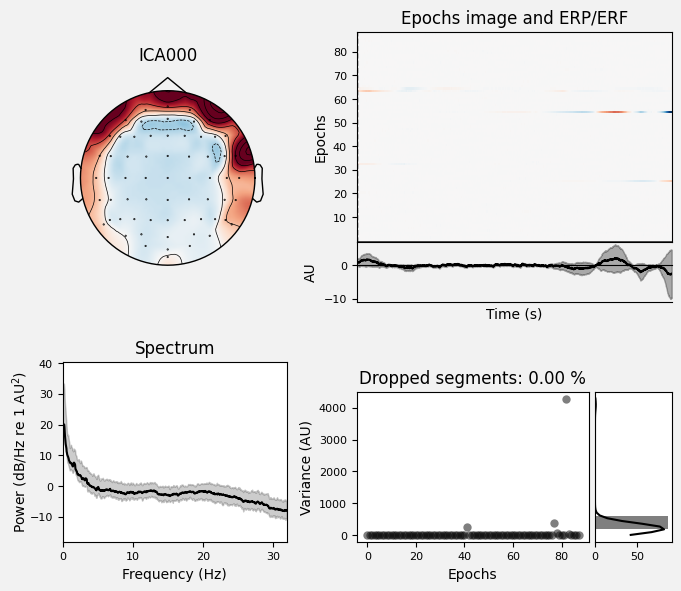

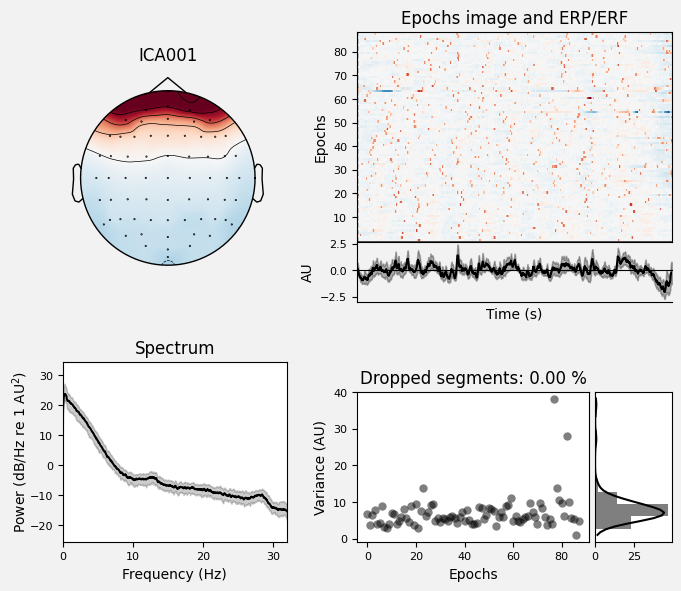

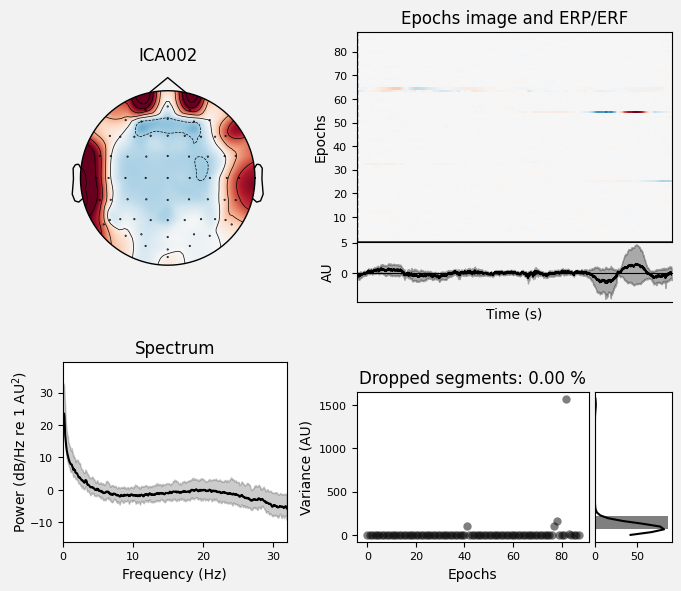

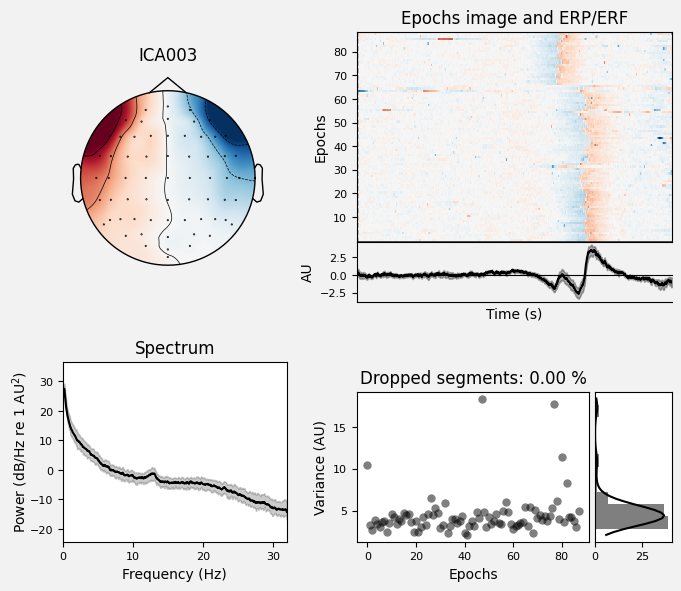

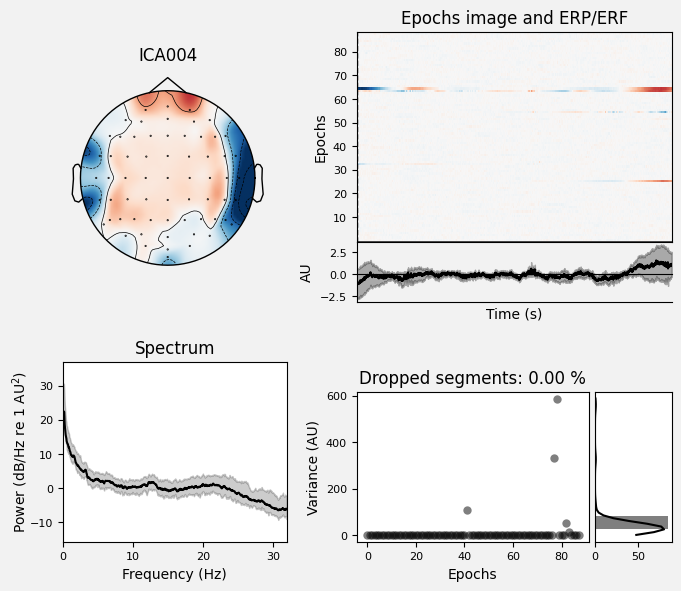

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [23]:
%matplotlib inline 

ica.plot_properties(
    trial_epochs, #[idx_101],
    image_args = {'order': sortOrder},
)

In [24]:
sources = ica.get_sources(trial_epochs).get_data(copy=True)
sources.shape

(88, 10, 1803)

In [25]:
sweeps = sources[:, 3, :]
sweeps.shape

(88, 1803)

# Find time stamps for eye sweeps (carriage returns)

Setting up band-pass filter from 0.2 - 0.25 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Upper passband edge: 0.25 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.25 Hz)
- Filter length: 1057 samples (16.516 s)

1280
1304
1316
1321
1136
1147
1160
1306
1283
1324
1303
1330
1292
1324
1151
1296
1320
1280
1277
1263
1284
1139
1304
1354
1311
1146
1147
1303
1294
1306
1141
1154
1309
1306
1284
1135
1312
1307
1296
1294
1315
1274
1269
1131
1306
1328
1161
1173
1296
1274
1289
1134
1308
1324
1300
1300
1144
1310
1306
1290
1316
1283
1152
1148
1148
1298
1279
1348
1319
1163
1286
1145
1131
1165
1304
1307
1284
1220
1295
1336
1336
1263
1226
1268
1168
1302
1320
1310


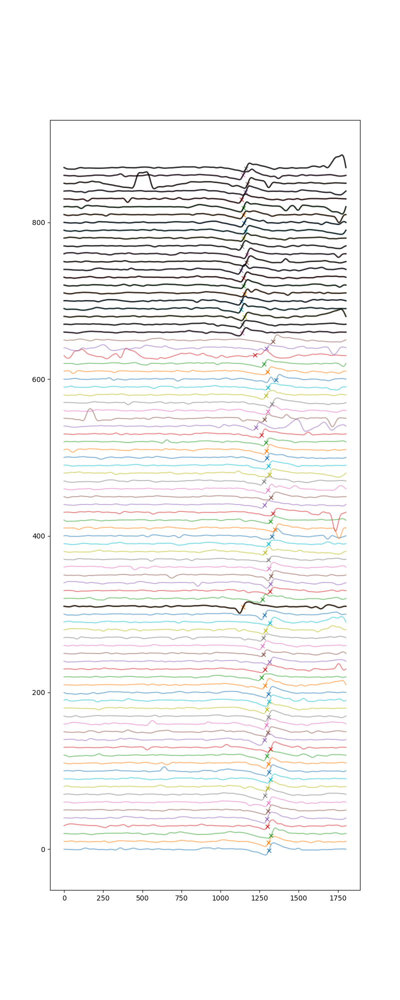

In [26]:
%matplotlib widget

sweeps_filt = mne.filter.filter_data(
    sweeps, 
    sfreq = 64, 
    l_freq = .2, 
    h_freq = .25, 
    copy=True,
)
#sweeps_filt = sweeps_filt[order, :]

# Correlate a candidate chunk of the filtered eye-sweep ICA

max_lags = []
break_offset = 1000
search_len = 400
manual_peak_0 = 1280 # for subject 1, optimize to place 'x' in middle (since its noncausal filter, so edge is in the middle)
for i in range(88):
    peak_corr = np.argmax(
        np.correlate(
            sweeps_filt[i][break_offset:break_offset+search_len] - np.mean(sweeps_filt[i][break_offset:break_offset+search_len]), 
            sweeps_filt[0][break_offset:break_offset+search_len] - np.mean(sweeps_filt[0][break_offset:break_offset+search_len]), 
            mode='full',
        )
    )
    max_lag = manual_peak_0 + peak_corr - (search_len -1)
    print(max_lag)

    max_lags.append(max_lag)
    
import matplotlib.pyplot as plt
plt.figure(1, figsize=(8, 20))
plt.clf()

# Add DC Offsets to traces for viz
j = 0
for i in list(sortOrder):
    sweeps_filt[i, :] += 10*j #5*i 
    
    line, = plt.plot(sweeps_filt[i, :].T, alpha = 0.5)
    plt.plot(max_lags[i], sweeps_filt[i, :][max_lags[i]], 'x', c=line.get_color())

    j += 1

# highlight chor-101 sweeps (fewer top row measures => earlier sweeps)
plt.plot(sweeps_filt[sortOrder[-22::]].T, color='k', lw=2, alpha = 0.75)
plt.plot(sweeps_filt[sortOrder[31]].T, color='k', lw=2, alpha = 0.75)

plt.show()

In [27]:
# Did the subject misread one trial?
sortOrder[31]

71

In [28]:
df.iloc[sortOrder[31], :] # could chor-038 have been misread as chor-101 for this one trial?

trial              71
condition     Imagery
chorale      chor-038
Name: 71, dtype: object

## Adding annotations for eye sweeps

In [29]:
current_annot = merged_raws.annotations
current_annot # these are just blinks, note annots to be added below

<Annotations | 746 segments: BAD blinker (22), BAD boundary (87), blinker ...>

In [30]:
sweep_annot = mne.Annotations(
    onset=[(max_lags[j] + 1803*j)/64 for j in range(88)],
    duration = [0]*88,
    description='sweep',
)
sweep_annot

<Annotations | 88 segments: sweep (88)>

In [31]:
merged_raws.set_annotations(
    current_annot + sweep_annot
)

<Raw | subject-1_trial-00_chor-096_condition-Listening_raw.fif, 68 x 158664 (2479.1 s), ~82.4 MiB, data loaded>

Sanity check sweep annots:

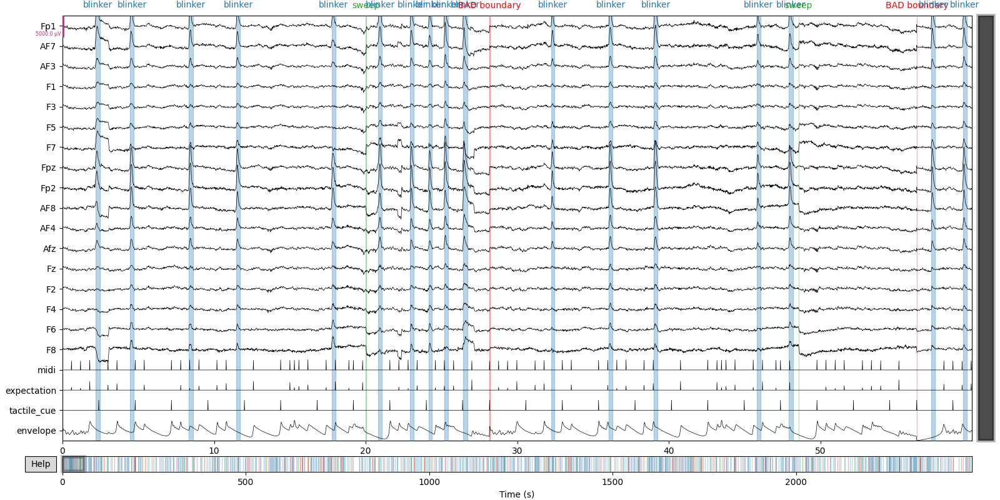

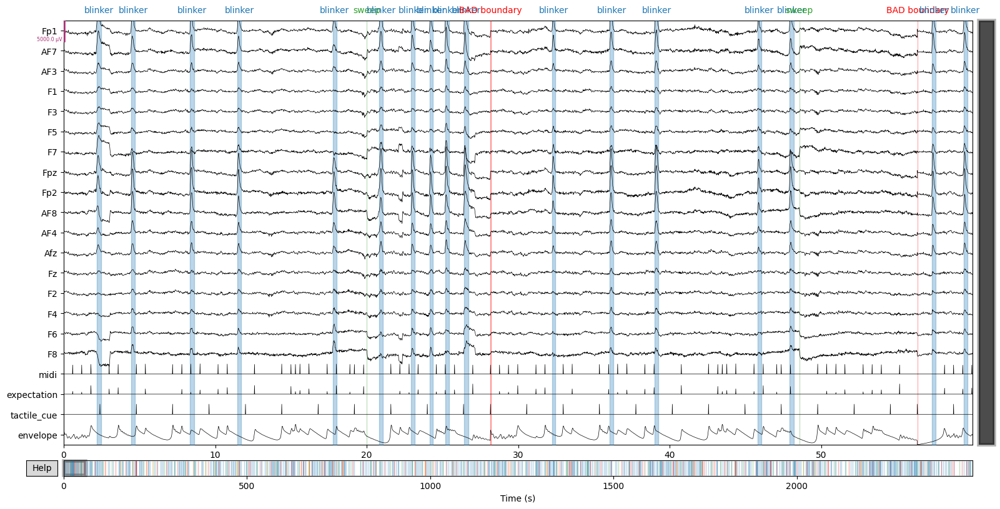

In [32]:
merged_raws.plot(
        n_channels = 64,
        duration = 60,
        scalings = {'eeg': 2.5e-3},
        #highpass = 1,
        #lowpass = 20,
        #group_by = 'position',
        picks = ['Fp1', 'Fpz', 'Fp2', 'AF7', 'AF3', 'Afz', 'AF4', 'AF8', 'F7', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'midi', 'expectation', 'envelope', 'tactile_cue']
    )

# Debugging filename cond-chor labeling error (fixed 5/21)

In [33]:
from scipy.io import loadmat

stim_mat = loadmat(STIM_MAT_PATH, simplify_cells = True) 
stim = stim_mat['stim']
# print(stim)

stimIdxs = stim['stimIdxs']
print(f'stimIdxs shape (N trials): {stimIdxs.shape}')

condIdxs = stim['condIdxs']
print(f'condIdxs shape (N trials): {condIdxs.shape}')

# Path to data for selected subject
sub1_mat = loadmat(os.path.join(EEG_MAT_PATH, f"dataSub{SUBJECT}.mat"), simplify_cells = True) 

# Randomized trial order for current subject
orig_trial_pos = sub1_mat['eeg']['origTrialPosition']
#print(f'orig_trial_pos shape: {orig_trial_pos.shape}')

# Get current subject's song and condition ordering (since its randomized)
thisSubStimOrder = stimIdxs[(orig_trial_pos-1)] # convert to being zero indexed
thisSubCondOrder = condIdxs[(orig_trial_pos-1)]

stimIdxs shape (N trials): (88,)
condIdxs shape (N trials): (88,)


In [34]:
thisSubStimOrder

array([1, 1, 2, 2, 3, 3, 3, 4, 1, 1, 1, 1, 1, 2, 3, 4, 4, 4, 1, 2, 2, 3,
       1, 1, 2, 3, 3, 4, 4, 4, 3, 3, 4, 2, 2, 3, 1, 1, 1, 1, 2, 2, 2, 3,
       2, 2, 3, 3, 4, 2, 2, 3, 4, 4, 4, 1, 3, 4, 4, 1, 2, 2, 3, 3, 3, 4,
       1, 2, 2, 3, 4, 2, 3, 3, 4, 4, 4, 1, 1, 1, 2, 1, 1, 2, 3, 4, 4, 4],
      dtype=uint8)

In [35]:
thisSubCondOrder

array([1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2],
      dtype=uint8)

# Make a new raw object

In [36]:
final_raw = make_new_raw(
    merged_raws,
    signal, # blink IC
    usedSignal, # label of the blink IC
    note_annot, # note and break annotations
)

Used Annotations descriptions: [np.str_('BAD blinker'), np.str_('BAD boundary'), np.str_('blinker'), np.str_('manual'), np.str_('sweep')]
Total valid blinks: 614
Total sweeps: 88


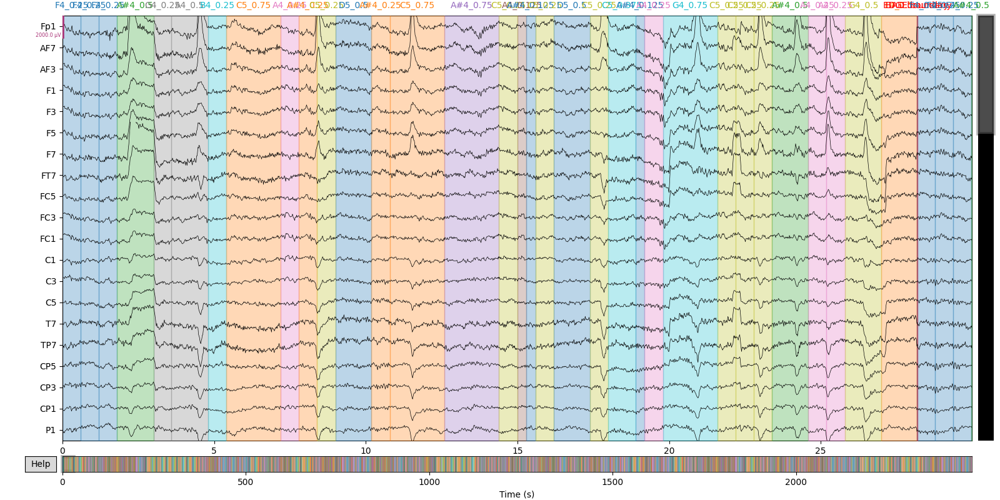

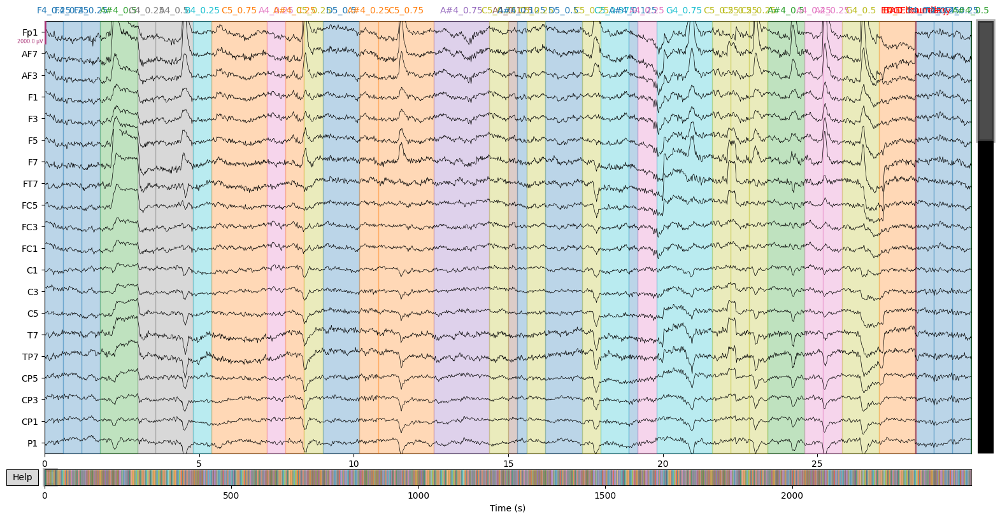

In [37]:
final_raw.plot(
    scalings = {'eeg': 1e-3, 'misc': 200e-6},
    duration = 30,
)

In [41]:
overwrite = not True
final_raw.save(
    fname = os.path.join(MERGED_FIF_PATH, f'subject-{SUBJECT}_blinks_merged_raw.fif'),
    overwrite = overwrite
)

Writing /local_disk/abhinav/eye-blink-music/3-find-blinks/3.2-manually-select-blinker-blinks/merged-fif/subject-1_blinks_merged_raw.fif
Closing /local_disk/abhinav/eye-blink-music/3-find-blinks/3.2-manually-select-blinker-blinks/merged-fif/subject-1_blinks_merged_raw.fif
[done]


[PosixPath('/local_disk/abhinav/eye-blink-music/3-find-blinks/3.2-manually-select-blinker-blinks/merged-fif/subject-1_blinks_merged_raw.fif')]